In [ ]:
import pandas as pd
import numpy as np

In [ ]:
from google.colab import files
data = files.upload()

Saving Hourly_2014-2024.csv to Hourly_2014-2024.csv


In [ ]:
df = pd.read_csv('Hourly_2014-2024.csv')
df.tail(25)

,YEAR,MO,DY,HR,PS,Precipitation (mm),Temperature
89879,2024,8,31,23,97.87,0.00,26.80
89880,2024,9,1,0,97.83,0.00,26.24
89881,2024,9,1,1,97.80,0.00,25.82
89882,2024,9,1,2,97.77,0.00,25.53
89883,2024,9,1,3,97.77,0.00,25.32
89884,2024,9,1,4,97.81,0.00,25.19
89885,2024,9,1,5,97.83,0.00,25.16
89886,2024,9,1,6,97.89,0.00,26.48
89887,2024,9,1,7,97.95,0.01,27.96
89888,2024,9,1,8,97.97,0.03,30.56


In [ ]:
from datetime import datetime
datetimes = []
for year,month,day,hour in zip(df['YEAR'],df['MO'],df['DY'],df['HR']):
  datetimes.append(datetime(year,month,day,hour))


## 01 : TEMPERATURE FORECAST

In [ ]:
df_using = df[['Temperature']]
df_using

,Temperature
0,31.22
1,29.89
2,28.60
3,27.65
4,27.08
...,...
89899,32.06
89900,30.98
89901,30.04
89902,28.98


In [ ]:
sum(df_using['Temperature'].isna())

0

In [ ]:
df_using['Temperature'].mean()

24.445430459156434

In [ ]:
df_using['Temperature'] = df_using['Temperature'].replace(-999.0, df_using['Temperature'].mean())
df_using[df_using['Temperature'] < 0]

<ipython-input-8-1ab2c161f82a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_using['Temperature'] = df_using['Temperature'].replace(-999.0, df_using['Temperature'].mean())


,Temperature
48870,-0.1


## TRAIN-TEST SPLIT : 80:20

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout



scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_using)


sequence_length = 32
max_features = len(df_using.columns)

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_data) - sequence_length):
    seq = scaled_data[i:i+sequence_length]
    label = scaled_data[i+sequence_length][0]  # '_tempm' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
train_x, test_x = sequences[:train_size], sequences[train_size:]
train_y, test_y = labels[:train_size], labels[train_size:]

print("Train X shape:", train_x.shape)
print("Train Y shape:", train_y.shape)
print("Test X shape:", test_x.shape)
print("Test Y shape:", test_y.shape)

Train X shape: (71897, 32, 1)
Train Y shape: (71897,)
Test X shape: (17975, 32, 1)
Test Y shape: (17975,)


In [ ]:
# Create the LSTM model
model = Sequential()

# Add LSTM layers with dropout
model.add(LSTM(units=128, input_shape=(train_x.shape[1], train_x.shape[2]), return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=64, return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=32, return_sequences=False))
model.add(Dropout(0.2))

# Add a dense output layer
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/dl/weather_prediction/best_model_weights.h5', monitor='val_loss', save_best_only=True)

# Train the model
history = model.fit(
    train_x, train_y,
    epochs=100,
    batch_size=64,
    validation_split=0.2,  # Use part of the training data as validation
    callbacks=[early_stopping]
)

Epoch 1/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 113s 120ms/step - loss: 0.0138 - val_loss: 0.0012
Epoch 2/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 108s 121ms/step - loss: 0.0029 - val_loss: 0.0010
Epoch 3/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 143s 121ms/step - loss: 0.0020 - val_loss: 0.0011
Epoch 4/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 112s 125ms/step - loss: 0.0015 - val_loss: 7.2962e-04
Epoch 5/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 139s 121ms/step - loss: 0.0012 - val_loss: 6.6671e-04
Epoch 6/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 108s 120ms/step - loss: 9.6265e-04 - val_loss: 4.4034e-04
Epoch 7/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 111s 123ms/step - loss: 8.0158e-04 - val_loss: 2.6280e-04
Epoch 8/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 141s 122ms/step - loss: 6.9694e-04 - val_loss: 3.3429e-04
Epoch 9/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 141s 121ms/step - loss: 6.4134e-04 - val_loss: 1.9149e-04
Epoch 10/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 110s 122ms/step - loss: 5.9647e-04 - val_loss: 2.8860e-04
Epoch 11/100
899/899 ━━━━━━━━━━━━━━━━━━━━

In [ ]:
import tensorflow as tf

test_loss = model.evaluate(test_x, test_y)
print("Test Loss : ", test_loss)

562/562 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 1.1011e-04
Test Loss :  0.00012005683674942702


In [ ]:
# y_true values
test_y_copies = np.repeat(test_y.reshape(-1,1), test_x.shape[-1], axis=-1)
true_temp = scaler.inverse_transform(test_y_copies)

# Predicted Values
prediction = model.predict(test_x)
prediction_copies = np.repeat(prediction,1,axis=-1)
predicted_temp = scaler.inverse_transform(prediction_copies)

562/562 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step


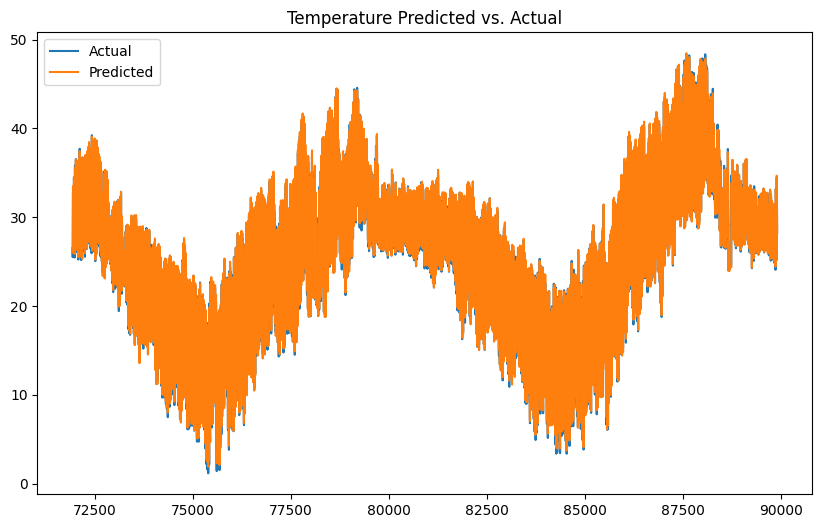

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(df_using.index[-17975:],df_using['Temperature'][-17975:],label='Actual')
plt.plot(df_using.index[-17975:],predicted_temp,label='Predicted')
plt.title('Temperature Predicted vs. Actual')
plt.legend()
plt.show()

In [ ]:
def calculate_mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

# Assuming you have the actual and predicted temperature values in arrays
y_true = test_y
y_pred = predicted_temp

mae = calculate_mae(y_true, y_pred)
print(f'MAE: {mae:.2f}')

MAE: 24.24


In [ ]:
def calculate_mse(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)

mse = calculate_mse(y_true, y_pred)
print(f'MSE: {mse:.2f}')

MSE: 666.37


In [ ]:
def calculate_rmse(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    return np.sqrt(mse)

rmse = calculate_rmse(y_true, y_pred)
print(f'RMSE: {rmse:.2f}')

RMSE: 25.81


## OUT OF SAMPLE FORECASTING

In [ ]:
n_steps = train_x.shape[1]

In [ ]:
def predict_future(model, data, n_steps, n_future):
    predictions = []
    current_step = data[-n_steps:]  # Start with the last sequence of data

    for _ in range(n_future):
        # Predicting next temperature
        next_temp = model.predict(current_step[np.newaxis, :, :])[0, 0]

        # Append the predicted temperature to the new step
        # Combine predicted temp with the rest of the features (dummy values for the other features)
        next_step = np.array([next_temp] + list(current_step[-1, 1:]))  # Keep the shape consistent

        # Shifting the window (move by 1 step and append the new step)
        current_step = np.vstack((current_step[1:], next_step))

        # Storing the predicted temperature
        predictions.append(next_temp)

    return predictions



In [ ]:

n_future = 15*24
predictions = predict_future(model, scaled_data, n_steps, n_future)

# Inverse transform the predicted values (for plotting the temperature back)
predicted_temperatures = scaler.inverse_transform([[pred] + [0]*(scaled_data.shape[1]-1) for pred in predictions])[:, 0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

In [ ]:
df['Dates'].iloc[-1]

KeyError: 'Dates'

In [ ]:
# Plot the actual and predicted temperatures
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(df['Dates'], scaler.inverse_transform(scaled_data)[:, 0], label='Actual Rainfall', color='blue')
plt.plot(pd.date_range(df['Dates'].iloc[-1], periods=n_future, freq='H'), predicted_temperatures, label='Forecasted Rainfall', color='red')
plt.title('Rainforecast (15 Aug - 30 Aug)')
plt.xlabel('Date')
plt.ylabel('Rainfall (in mm)')
plt.legend()
plt.grid(True)
plt.show()

KeyError: 'Dates'

<Figure size 1200x600 with 0 Axes>

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[
    go.Scatter(x=datetimes, y=scaler.inverse_transform(scaled_data)[:, 0], name='Actual Rainfall', line=dict(color='blue')),
    go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))
])

fig.update_layout(
    title='Rain Forecast (15 Aug - 30 Aug)',
    xaxis_title='Date',
    yaxis_title='Rainfall (mm)',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
)

fig.show()

<ipython-input-21-19e151ffcf89>:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))


In [ ]:
predicted_temperatures

array([27.73453473, 27.16240099, 26.64012174, 26.21934808, 26.06658132,
       26.35143649, 27.19835919, 28.58015186, 30.27196379, 31.95056111,
       33.36970132, 34.44498417, 35.20107984, 35.67731157, 35.85710547,
       35.67532432, 35.07069272, 34.10608338, 32.97230093, 31.87362748,
       30.9177239 , 30.10889974, 29.402699  , 28.7631837 , 28.16401993,
       27.59512413, 27.05920565, 26.58690799, 26.28008911, 26.31482839,
       26.91068201, 28.19232087, 30.02141175, 32.00366799, 33.73735366,
       35.03929248, 35.93190454, 36.49904417, 36.77434727, 36.70668842,
       36.20024072, 35.22589155, 33.93127781, 32.59801096, 31.44762864,
       30.5274233 , 29.77520392, 29.1197502 , 28.51749002, 27.94419223,
       27.38644581, 26.85584496, 26.42486355, 26.26591842, 26.64729663,
       27.81007036, 29.72387343, 31.96802174, 33.99822032, 35.5215235 ,
       36.55087436, 37.21463234, 37.59217181, 37.65357718, 37.28000065,
       36.36990775, 35.0050789 , 33.49286445, 32.15494431, 31.10

## 02 : Pressure Prediction

In [ ]:
df_pressure = df[['PS']]
df_pressure

,PS
0,97.52
1,97.52
2,97.52
3,97.55
4,97.60
...,...
89899,97.75
89900,97.78
89901,97.81
89902,97.85


In [ ]:
df_pressure[df_pressure['PS'] < 0]

,PS
88661,-999.0
88662,-999.0
88663,-999.0
88664,-999.0
88665,-999.0
...,...
88728,-999.0
88729,-999.0
88730,-999.0
88731,-999.0


In [ ]:

#df_pressure['PS'] = df_pressure['PS'].replace(-999.0, df_pressure['PS'].mean())
df_pressure = df_pressure.mask(df_pressure < 0, df_pressure['PS'].mean())
df_pressure[df_pressure['PS'] < 0]

,PS


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout



scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_pressure)


sequence_length = 32
max_features = len(df_pressure.columns)

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_data) - sequence_length):
    seq = scaled_data[i:i+sequence_length]
    label = scaled_data[i+sequence_length][0]  # '_tempm' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
train_x, test_x = sequences[:train_size], sequences[train_size:]
train_y, test_y = labels[:train_size], labels[train_size:]

print("Train X shape:", train_x.shape)
print("Train Y shape:", train_y.shape)
print("Test X shape:", test_x.shape)
print("Test Y shape:", test_y.shape)

Train X shape: (71897, 32, 1)
Train Y shape: (71897,)
Test X shape: (17975, 32, 1)
Test Y shape: (17975,)


In [ ]:
# Create the LSTM model
model = Sequential()

# Add LSTM layers with dropout
model.add(LSTM(units=128, input_shape=(train_x.shape[1], train_x.shape[2]), return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=64, return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=32, return_sequences=False))
model.add(Dropout(0.2))

# Add a dense output layer
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/dl/weather_prediction/best_model_weights.h5', monitor='val_loss', save_best_only=True)

# Train the model
history = model.fit(
    train_x, train_y,
    epochs=100,
    batch_size=64,
    validation_split=0.2,  # Use part of the training data as validation
    callbacks=[early_stopping]
)

Epoch 1/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 169s 180ms/step - loss: 0.0107 - val_loss: 0.0021
Epoch 2/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 166s 140ms/step - loss: 0.0035 - val_loss: 9.7574e-04
Epoch 3/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 141s 139ms/step - loss: 0.0016 - val_loss: 1.2570e-04
Epoch 4/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 144s 142ms/step - loss: 8.1614e-04 - val_loss: 1.4641e-04
Epoch 5/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 141s 141ms/step - loss: 5.8697e-04 - val_loss: 2.8915e-04
Epoch 6/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 143s 142ms/step - loss: 5.2748e-04 - val_loss: 1.2509e-04
Epoch 7/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 142s 142ms/step - loss: 4.8387e-04 - val_loss: 8.1162e-05
Epoch 8/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 142s 143ms/step - loss: 4.8527e-04 - val_loss: 9.1116e-05
Epoch 9/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 141s 142ms/step - loss: 4.7711e-04 - val_loss: 8.7579e-05
Epoch 10/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 4.5305e-04 - val_loss: 5.2866e-05
Epoch 11/100
899/899 ━━━━

In [ ]:
import tensorflow as tf

test_loss = model.evaluate(test_x, test_y)
print("Test Loss : ", test_loss)

562/562 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 2.5602e-05
Test Loss :  3.0901035643182695e-05


In [ ]:
# y_true values
test_y_copies = np.repeat(test_y.reshape(-1,1), test_x.shape[-1], axis=-1)
true_temp = scaler.inverse_transform(test_y_copies)

# Predicted Values
prediction = model.predict(test_x)
prediction_copies = np.repeat(prediction,1,axis=-1)
predicted_temp = scaler.inverse_transform(prediction_copies)

562/562 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step


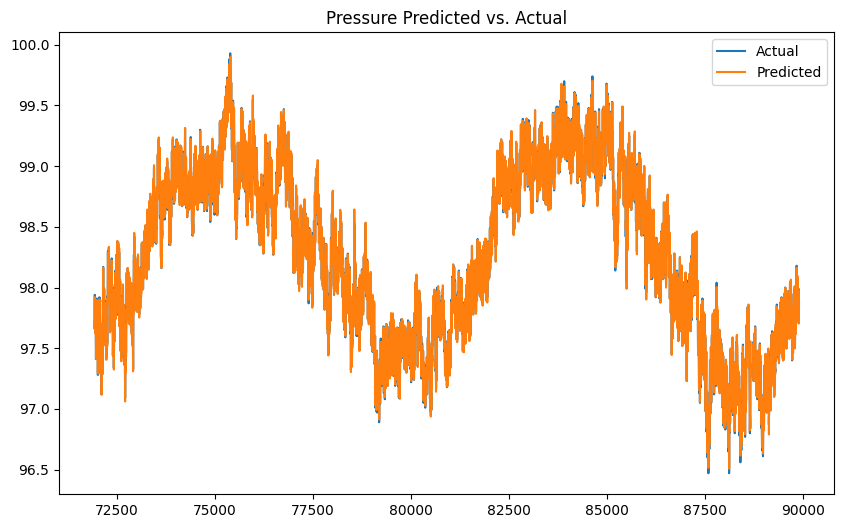

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(df_pressure.index[-17975:],df_pressure['PS'][-17975:],label='Actual')
plt.plot(df_pressure.index[-17975:],predicted_temp,label='Predicted')
plt.title('Pressure Predicted vs. Actual')
plt.legend()
plt.show()

In [ ]:
def calculate_mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

# Assuming you have the actual and predicted temperature values in arrays
y_true = test_y
y_pred = predicted_temp

mae = calculate_mae(y_true, y_pred)
print(f'MAE: {mae:.2f}')

MAE: 97.72


In [ ]:
def calculate_mse(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)

mse = calculate_mse(y_true, y_pred)
print(f'MSE: {mse:.2f}')

MSE: 9550.51


In [ ]:
def calculate_rmse(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    return np.sqrt(mse)

rmse = calculate_rmse(y_true, y_pred)
print(f'RMSE: {rmse:.2f}')

RMSE: 97.73


## OUT OF SAMPLE FORECASTING

In [ ]:
n_steps = train_x.shape[1]

In [ ]:
def predict_future(model, data, n_steps, n_future):
    predictions = []
    current_step = data[-n_steps:]  # Start with the last sequence of data

    for _ in range(n_future):
        # Predicting next temperature
        next_temp = model.predict(current_step[np.newaxis, :, :])[0, 0]

        # Append the predicted temperature to the new step
        # Combine predicted temp with the rest of the features (dummy values for the other features)
        next_step = np.array([next_temp] + list(current_step[-1, 1:]))  # Keep the shape consistent

        # Shifting the window (move by 1 step and append the new step)
        current_step = np.vstack((current_step[1:], next_step))

        # Storing the predicted temperature
        predictions.append(next_temp)

    return predictions



In [ ]:

n_future = 15*24
predictions = predict_future(model, scaled_data, n_steps, n_future)

# Inverse transform the predicted values (for plotting the temperature back)
predicted_temperatures = scaler.inverse_transform([[pred] + [0]*(scaled_data.shape[1]-1) for pred in predictions])[:, 0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[
    go.Scatter(x=datetimes, y=scaler.inverse_transform(scaled_data)[:, 0], name='Actual Rainfall', line=dict(color='blue')),
    go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))
])

fig.update_layout(
    title='Rain Forecast (15 Aug - 30 Aug)',
    xaxis_title='Date',
    yaxis_title='Rainfall (mm)',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
)

fig.show()

<ipython-input-20-19e151ffcf89>:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))


In [ ]:
model.save('pressure_forecast_01.h5')

In [ ]:
predicted_pressure = predicted_temperatures
predicted_pressure

array([97.87789148, 97.85982275, 97.83529779, 97.81588986, 97.80897884,
       97.81859128, 97.84302526, 97.87502303, 97.90417765, 97.91981693,
       97.91398893, 97.88402759, 97.83334607, 97.77041224, 97.70686707,
       97.65448687, 97.62255855, 97.6160622 , 97.63436212, 97.67116243,
       97.71598101, 97.75680235, 97.78322428, 97.78930857, 97.77500264,
       97.74579717, 97.71096112, 97.68073885, 97.66378818, 97.66481699,
       97.68330256, 97.71319509, 97.74416015, 97.76435337, 97.76389933,
       97.73804146, 97.68873396, 97.62416182, 97.55651296, 97.49889197,
       97.46226681, 97.45302489, 97.47146967, 97.51150464, 97.56176003,
       97.60824559, 97.63809842, 97.64329842, 97.62294477, 97.58322407,
       97.53525544, 97.49178731, 97.46382204, 97.45789256, 97.47437859,
       97.5071437 , 97.54476132, 97.57339397, 97.58080057, 97.56022081,
       97.51263482, 97.44653146, 97.37544825, 97.3143533 , 97.27601475,
       97.26810466, 97.29138823, 97.33922899, 97.39869881, 97.45

## 03 MULTIVARIATE RAIN FORECASTING

In [ ]:
df_complete = df[['Temperature','PS','Precipitation (mm)']]
df_complete['PS'] = df_complete['PS'].mask(df_complete['PS'] < 0, df_complete['PS'].mean())
df_complete['Temperature'] = df_complete['Temperature'].mask(df_complete['Temperature'] < 0, df_complete['Temperature'].mean())
df_complete['Precipitation (mm)'] = df_complete['Precipitation (mm)'].mask(df_complete['Precipitation (mm)'] < 0, df_complete[df['Precipitation (mm)'] > 0]['Precipitation (mm)'].mean())
df_complete[df_complete['Precipitation (mm)'] < 0]

<ipython-input-47-d73a5eddc171>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-47-d73a5eddc171>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-47-d73a5eddc171>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Temperature,PS,Precipitation (mm)


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout



scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_complete)


sequence_length = 32
max_features = len(df_complete.columns)

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_data) - sequence_length):
    seq = scaled_data[i:i+sequence_length]
    label = scaled_data[i+sequence_length][2]  # 'Precipitation' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
train_x, test_x = sequences[:train_size], sequences[train_size:]
train_y, test_y = labels[:train_size], labels[train_size:]

print("Train X shape:", train_x.shape)
print("Train Y shape:", train_y.shape)
print("Test X shape:", test_x.shape)
print("Test Y shape:", test_y.shape)

Train X shape: (71897, 32, 3)
Train Y shape: (71897,)
Test X shape: (17975, 32, 3)
Test Y shape: (17975,)


In [ ]:
# Create the LSTM model
model = Sequential()

# Add LSTM layers with dropout
model.add(LSTM(units=128, input_shape=(train_x.shape[1], train_x.shape[2]), return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=64, return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=32, return_sequences=False))
model.add(Dropout(0.2))

# Add a dense output layer
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/dl/weather_prediction/best_model_weights.h5', monitor='val_loss', save_best_only=True)

# Train the model
history = model.fit(
    train_x, train_y,
    epochs=100,
    batch_size=64,
    validation_split=0.2,  # Use part of the training data as validation
    callbacks=[early_stopping]
)

Epoch 1/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 132s 140ms/step - loss: 3.1650e-04 - val_loss: 7.8498e-05
Epoch 2/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 139s 137ms/step - loss: 5.2559e-05 - val_loss: 7.3556e-05
Epoch 3/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 146s 142ms/step - loss: 4.0320e-05 - val_loss: 6.4871e-05
Epoch 4/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 140s 140ms/step - loss: 4.3116e-05 - val_loss: 5.4087e-05
Epoch 5/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 143s 142ms/step - loss: 3.4607e-05 - val_loss: 5.2862e-05
Epoch 6/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 139s 139ms/step - loss: 3.0018e-05 - val_loss: 4.1785e-05
Epoch 7/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 144s 141ms/step - loss: 2.5354e-05 - val_loss: 4.3207e-05
Epoch 8/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 142s 141ms/step - loss: 2.4548e-05 - val_loss: 4.0092e-05
Epoch 9/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 139s 137ms/step - loss: 2.4472e-05 - val_loss: 4.2240e-05
Epoch 10/100
899/899 ━━━━━━━━━━━━━━━━━━━━ 141s 137ms/step - loss: 2.5417e-05 - val_loss: 4.1288e-05
Epoch 11/

In [ ]:
import tensorflow as tf

test_loss = model.evaluate(test_x, test_y)
print("Test Loss : ", test_loss)

562/562 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 3.0692e-05
Test Loss :  0.00010754913819255307


In [ ]:
# y_true values
test_y_copies = np.repeat(test_y.reshape(-1,1), test_x.shape[-1], axis=-1)
true_temp = scaler.inverse_transform(test_y_copies)

# Predicted Values
prediction = model.predict(test_x)
prediction_copies = np.repeat(prediction,3,axis=-1)
predicted_temp = scaler.inverse_transform(prediction_copies)[:,3]

562/562 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step


ValueError: non-broadcastable output operand with shape (17975,1) doesn't match the broadcast shape (17975,3)

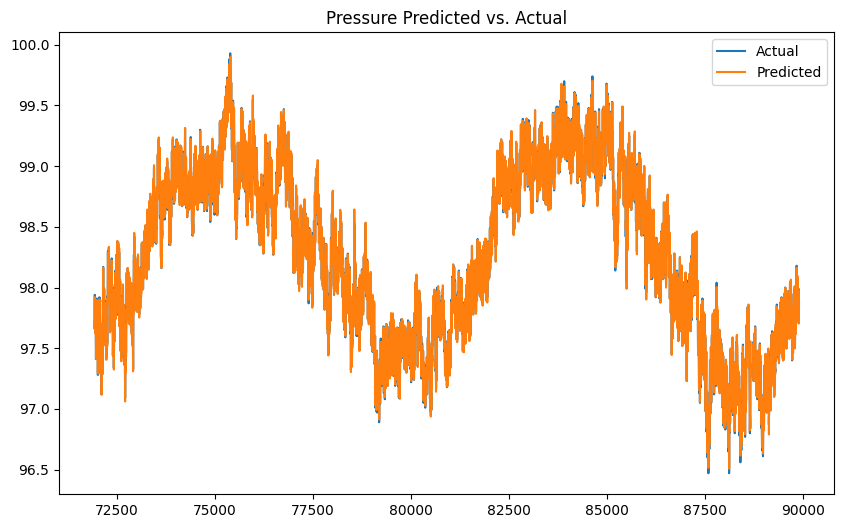

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(df_pressure.index[-17975:],df_pressure['PS'][-17975:],label='Actual')
plt.plot(df_pressure.index[-17975:],predicted_temp,label='Predicted')
plt.title('Pressure Predicted vs. Actual')
plt.legend()
plt.show()

In [ ]:
def calculate_mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

# Assuming you have the actual and predicted temperature values in arrays
y_true = test_y
y_pred = predicted_temp

mae = calculate_mae(y_true, y_pred)
print(f'MAE: {mae:.2f}')

MAE: 97.72


In [ ]:
def calculate_mse(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)

mse = calculate_mse(y_true, y_pred)
print(f'MSE: {mse:.2f}')

MSE: 9550.51


In [ ]:
def calculate_rmse(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    return np.sqrt(mse)

rmse = calculate_rmse(y_true, y_pred)
print(f'RMSE: {rmse:.2f}')

RMSE: 97.73


## OUT OF SAMPLE FORECASTING

In [ ]:
n_steps = train_x.shape[1]

In [ ]:
def predict_future(model, data, n_steps, n_future):
    predictions = []
    current_step = data[-n_steps:]  # Start with the last sequence of data

    for _ in range(n_future):
        # Predicting next temperature
        next_temp = model.predict(current_step[np.newaxis, :, :])[0, 0]

        # Append the predicted temperature to the new step
        # Combine predicted temp with the rest of the features (dummy values for the other features)
        next_step = np.array([next_temp] + list(current_step[-1, 1:]))  # Keep the shape consistent

        # Shifting the window (move by 1 step and append the new step)
        current_step = np.vstack((current_step[1:], next_step))

        # Storing the predicted temperature
        predictions.append(next_temp)

    return predictions



In [ ]:

n_future = 15*24
predictions = predict_future(model, scaled_data, n_steps, n_future)

# Inverse transform the predicted values (for plotting the temperature back)
predicted_temperatures = scaler.inverse_transform([[pred] + [0]*(scaled_data.shape[1]-1) for pred in predictions])[:, 0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[
    go.Scatter(x=datetimes, y=scaler.inverse_transform(scaled_data)[:, 0], name='Actual Rainfall', line=dict(color='blue')),
    go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))
])

fig.update_layout(
    title='Rain Forecast (15 Aug - 30 Aug)',
    xaxis_title='Date',
    yaxis_title='Rainfall (mm)',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
)

fig.show()

<ipython-input-20-19e151ffcf89>:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))


## TRAIN-TEST SPLIT - 70:30

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout



scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_using)


sequence_length = 32
max_features = len(df_using.columns)

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_data) - sequence_length):
    seq = scaled_data[i:i+sequence_length]
    label = scaled_data[i+sequence_length][0]  # '_tempm' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.7 * len(sequences))
train_x, test_x = sequences[:train_size], sequences[train_size:]
train_y, test_y = labels[:train_size], labels[train_size:]

print("Train X shape:", train_x.shape)
print("Train Y shape:", train_y.shape)
print("Test X shape:", test_x.shape)
print("Test Y shape:", test_y.shape)

Train X shape: (62910, 32, 1)
Train Y shape: (62910,)
Test X shape: (26962, 32, 1)
Test Y shape: (26962,)


In [ ]:
# Create the LSTM model
model = Sequential()

# Add LSTM layers with dropout
model.add(LSTM(units=128, input_shape=(train_x.shape[1], train_x.shape[2]), return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=64, return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=32, return_sequences=False))
model.add(Dropout(0.2))

# Add a dense output layer
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/dl/weather_prediction/best_model_weights.h5', monitor='val_loss', save_best_only=True)

# Train the model
history = model.fit(
    train_x, train_y,
    epochs=100,
    batch_size=64,
    validation_split=0.2,  # Use part of the training data as validation
    callbacks=[early_stopping]
)

Epoch 1/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 114s 138ms/step - loss: 6.7984e-05 - val_loss: 6.6120e-05
Epoch 2/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 138s 133ms/step - loss: 3.3425e-05 - val_loss: 5.5011e-05
Epoch 3/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 104s 133ms/step - loss: 2.5180e-05 - val_loss: 5.2251e-05
Epoch 4/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 141s 132ms/step - loss: 2.3991e-05 - val_loss: 5.3285e-05
Epoch 5/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 145s 136ms/step - loss: 2.0543e-05 - val_loss: 5.2633e-05
Epoch 6/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 140s 134ms/step - loss: 2.2377e-05 - val_loss: 5.0500e-05
Epoch 7/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 143s 135ms/step - loss: 2.7758e-05 - val_loss: 5.2498e-05
Epoch 8/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 141s 134ms/step - loss: 2.5478e-05 - val_loss: 4.9800e-05
Epoch 9/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 143s 136ms/step - loss: 2.1261e-05 - val_loss: 5.0001e-05
Epoch 10/100
787/787 ━━━━━━━━━━━━━━━━━━━━ 139s 132ms/step - loss: 2.1694e-05 - val_loss: 5.1682e-05
Epoch 11/

In [ ]:
# y_true values
test_y_copies = np.repeat(test_y.reshape(-1,1), test_x.shape[-1], axis=-1)
true_temp = scaler.inverse_transform(test_y_copies)

# Predicted Values
prediction = model.predict(test_x)
prediction_copies = np.repeat(prediction,1,axis=-1)
predicted_temp = scaler.inverse_transform(prediction_copies)

843/843 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step


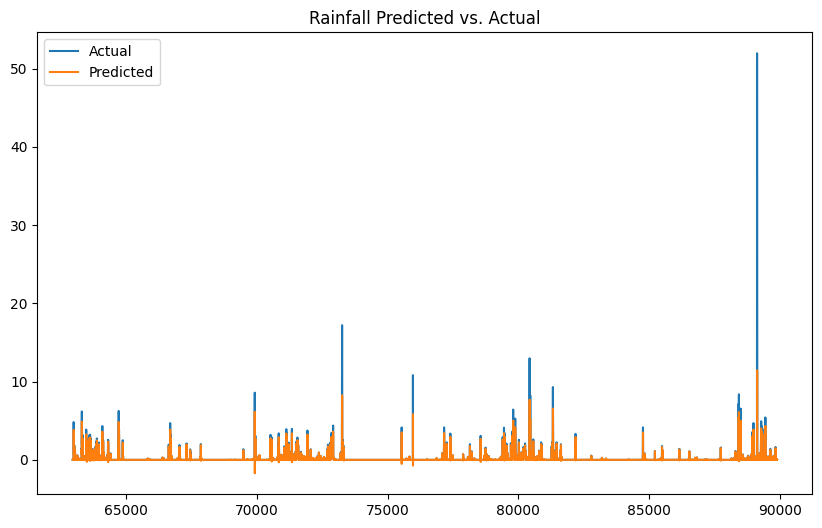

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(df_using.index[-26962:],df_using['Precipitation (mm)'][-26962:],label='Actual')
plt.plot(df_using.index[-26962:],predicted_temp,label='Predicted')
plt.title('Rainfall Predicted vs. Actual')
plt.legend()
plt.show()

In [ ]:
def predict_future(model, data, n_steps, n_future):
    predictions = []
    current_step = data[-n_steps:]  # Start with the last sequence of data

    for _ in range(n_future):
        # Predicting next temperature
        next_temp = model.predict(current_step[np.newaxis, :, :])[0, 0]

        # Append the predicted temperature to the new step
        # Combine predicted temp with the rest of the features (dummy values for the other features)
        next_step = np.array([next_temp] + list(current_step[-1, 1:]))  # Keep the shape consistent

        # Shifting the window (move by 1 step and append the new step)
        current_step = np.vstack((current_step[1:], next_step))

        # Storing the predicted temperature
        predictions.append(next_temp)

    return predictions



In [ ]:
n_steps = train_x.shape[1]
n_future = 15*24
predictions = predict_future(model, scaled_data, n_steps, n_future)

# Inverse transform the predicted values (for plotting the temperature back)
predicted_temperatures = scaler.inverse_transform([[pred] + [0]*(scaled_data.shape[1]-1) for pred in predictions])[:, 0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[
    go.Scatter(x=datetimes, y=scaler.inverse_transform(scaled_data)[:, 0], name='Actual Rainfall', line=dict(color='blue')),
    go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))
])

fig.update_layout(
    title='Rain Forecast (15 Aug - 30 Aug)',
    xaxis_title='Date',
    yaxis_title='Rainfall (mm)',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
)

fig.show()

<ipython-input-19-19e151ffcf89>:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  go.Scatter(x=pd.date_range(datetimes[-1], periods=n_future, freq='H'), y=predicted_temperatures, name='Forecasted Rainfall', line=dict(color='red'))


In [ ]:
def calculate_mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

# Assuming you have the actual and predicted temperature values in arrays
y_true = test_y
y_pred = predicted_temp

mae = calculate_mae(y_true, y_pred)
print(f'MAE: {mae:.2f}')

MAE: 0.10


In [ ]:
def calculate_mse(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)

mse = calculate_mse(y_true, y_pred)
print(f'MSE: {mse:.2f}')

MSE: 0.18


In [ ]:
def calculate_rmse(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    return np.sqrt(mse)

rmse = calculate_rmse(y_true, y_pred)
print(f'RMSE: {rmse:.2f}')

RMSE: 0.43


## TRAIN-TEST SPLIT 90-10

In [ ]:
values = df_using['Precipitation (mm)'].values

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(values.reshape(-1, 1))

# 2. SPLIT DATA AT AUGUST 15, 2024
train_data = scaled_data
# Note: We don't need separate test data since we're forecasting beyond our dataset

# 3. CREATE DATASETS FOR LSTM (using a 24-hour lookback)
look_back = 24
X_train, y_train = [], []
for i in range(len(train_data) - look_back - 1):
    a = train_data[i:(i+look_back), 0]
    X_train.append(a)
    y_train.append(train_data[i + look_back, 0])

X_train = np.array(X_train).reshape((len(X_train), 1, look_back))
y_train = np.array(y_train)

# 4. BUILD AND TRAIN THE LSTM MODEL
model = Sequential()
model.add(LSTM(50, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, epochs=100, batch_size=1, verbose=2)

# 5. FORECAST FROM AUG 16 TO SEPT 1
hours_to_forecast = int((pd.to_datetime('2024-09-01 23:00:00') -
                           pd.to_datetime('2024-08-15 23:00:00')).total_seconds() / 3600)
forecast_input = train_data[-look_back:] # Last 24 hours of training data
forecast = []

for _ in range(hours_to_forecast):
    prediction = model.predict(forecast_input.reshape(1, 1, look_back))
    forecast.append(prediction[0, 0])
    forecast_input = np.append(forecast_input[1:], prediction) # Update input for next hour

# 6. INVERT SCALING AND CREATE DATAFRAME
forecast = scaler.inverse_transform(np.array(forecast).reshape(-1, 1))
forecast_dates = pd.date_range(start='2024-08-16 00:00:00', periods=hours_to_forecast, freq='H')
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Rainfall': forecast.flatten()})

# 7. PRINT/SAVE FORECAST
print(forecast_df)
# You can also save the forecast_df to a CSV file if needed

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


89879/89879 - 160s - 2ms/step - loss: 4.5884e-05
Epoch 2/100
89879/89879 - 202s - 2ms/step - loss: 3.7793e-05
Epoch 3/100
89879/89879 - 155s - 2ms/step - loss: 4.1426e-05
Epoch 4/100
89879/89879 - 205s - 2ms/step - loss: 4.5356e-05
Epoch 5/100
89879/89879 - 197s - 2ms/step - loss: 4.6389e-05
Epoch 6/100
89879/89879 - 153s - 2ms/step - loss: 4.6343e-05
Epoch 7/100
89879/89879 - 202s - 2ms/step - loss: 4.4734e-05
Epoch 8/100
89879/89879 - 152s - 2ms/step - loss: 4.5219e-05
Epoch 9/100
89879/89879 - 202s - 2ms/step - loss: 4.4191e-05
Epoch 10/100
89879/89879 - 202s - 2ms/step - loss: 4.4574e-05
Epoch 11/100
89879/89879 - 153s - 2ms/step - loss: 4.3906e-05
Epoch 12/100
89879/89879 - 199s - 2ms/step - loss: 4.4508e-05
Epoch 13/100
89879/89879 - 203s - 2ms/step - loss: 4.3323e-05
Epoch 14/100
89879/89879 - 202s - 2ms/step - loss: 4.2753e-05
Epoch 15/100
89879/89879 - 149s - 2ms/step - loss: 4.2466e-05
Epoch 16/100
89879/89879 - 202s - 2ms/step - loss: 4.2233e-05
Epoch 17/100
89879/89879 - 15

<ipython-input-10-8ba14d79cac1>:42: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  forecast_dates = pd.date_range(start='2024-08-16 00:00:00', periods=hours_to_forecast, freq='H')


In [ ]:
forecast_df

,Date,Rainfall
0,2024-08-16 00:00:00,0.126134
1,2024-08-16 01:00:00,0.248832
2,2024-08-16 02:00:00,0.366072
3,2024-08-16 03:00:00,0.458067
4,2024-08-16 04:00:00,0.523849
...,...,...
403,2024-09-01 19:00:00,1.348386
404,2024-09-01 20:00:00,1.348386
405,2024-09-01 21:00:00,1.348387
406,2024-09-01 22:00:00,1.348387


from matplotlib import pyplot as plt
forecast_df['Rainfall'].plot(kind='hist', bins=20, title='Rainfall')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Rainfall']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = forecast_df.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Rainfall')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = forecast_df.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Rainfall']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = forecast_df.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Rainfall')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = forecast_df.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
forecast_df['Rainfall'].plot(kind='line', figsize=(8, 4), title='Rainfall')
plt.gca().spines[['top', 'right']].set_visible(False)

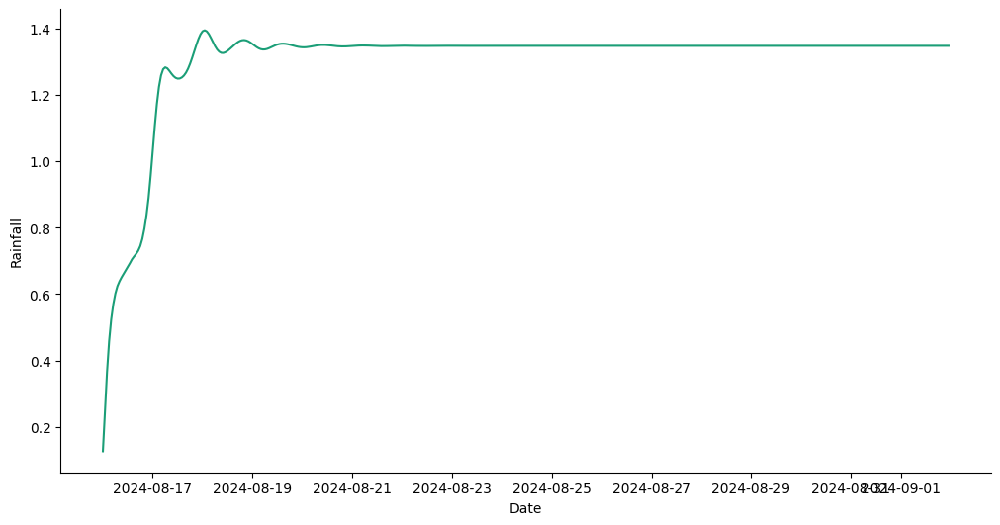

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Rainfall']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = forecast_df.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Rainfall')

In [ ]:
predicted_pressure = [97.87789148, 97.85982275, 97.83529779, 97.81588986, 97.80897884,
       97.81859128, 97.84302526, 97.87502303, 97.90417765, 97.91981693,
       97.91398893, 97.88402759, 97.83334607, 97.77041224, 97.70686707,
       97.65448687, 97.62255855, 97.6160622 , 97.63436212, 97.67116243,
       97.71598101, 97.75680235, 97.78322428, 97.78930857, 97.77500264,
       97.74579717, 97.71096112, 97.68073885, 97.66378818, 97.66481699,
       97.68330256, 97.71319509, 97.74416015, 97.76435337, 97.76389933,
       97.73804146, 97.68873396, 97.62416182, 97.55651296, 97.49889197,
       97.46226681, 97.45302489, 97.47146967, 97.51150464, 97.56176003,
       97.60824559, 97.63809842, 97.64329842, 97.62294477, 97.58322407,
       97.53525544, 97.49178731, 97.46382204, 97.45789256, 97.47437859,
       97.5071437 , 97.54476132, 97.57339397, 97.58080057, 97.56022081,
       97.51263482, 97.44653146, 97.37544825, 97.3143533 , 97.27601475,
       97.26810466, 97.29138823, 97.33922899, 97.39869881, 97.45350014,
       97.4883325 , 97.49343493, 97.46752383, 97.41791634, 97.35798739,
       97.30318649, 97.26699493, 97.25771039, 97.27645083, 97.31661756,
       97.36512202, 97.40557208, 97.42297495, 97.40853649, 97.36263328,
       97.29471354, 97.22036116, 97.15690946, 97.11910868, 97.11576476,
       97.14767966, 97.20705732, 97.27871173, 97.34343079, 97.3831913 ,
       97.38670495, 97.35301121, 97.29152757, 97.21878375, 97.1534909 ,
       97.11172144, 97.10323269, 97.12925522, 97.18189387, 97.24548599,
       97.3002872 , 97.32811778, 97.31827372, 97.27120333, 97.19828773,
       97.11807662, 97.05087099, 97.01360117, 97.01604025, 97.05856676,
       97.13154219, 97.21672201, 97.29127182, 97.33413056, 97.33278586,
       97.28747267, 97.21081525, 97.12342375, 97.04775014, 97.00244843,
       96.99832581, 97.03602447, 97.1054355 , 97.1872886 , 97.25755482,
       97.29437623, 97.28536084, 97.2319303 , 97.1486123 , 97.05799405,
       96.98400008, 96.9459429 , 96.95439639, 97.00885932, 97.09713953,
       97.19704622, 97.28129091, 97.32536973, 97.31584773, 97.25508274,
       97.16003355, 97.05625382, 96.97030624, 96.92333245, 96.92676692,
       96.98000457, 97.0698411 , 97.17234396, 97.25821538, 97.30143935,
       97.28830546, 97.22234047, 97.12261228, 97.01686666, 96.93324888,
       96.89356833, 96.90896972, 96.97757263, 97.08385592, 97.20067077,
       97.29528983, 97.33927507, 97.31861493, 97.23884088, 97.12245498,
       97.00080027, 96.9048484 , 96.85808416, 96.87216108, 96.94461561,
       97.05828343, 97.18346186, 97.28453195, 97.33088596, 97.30808337,
       97.22317098, 97.10131537, 96.97651385, 96.88157944, 96.84076643,
       96.8654396 , 96.95175522, 97.07997812, 97.2168223 , 97.32296917,
       97.36553376, 97.33046599, 97.22780454, 97.08698704, 96.94600489,
       96.84045119, 96.79593249, 96.82388662, 96.9193747 , 97.06035156,
       97.21010698, 97.32554348, 97.37111976, 97.33258247, 97.22227372,
       97.07316869, 96.92650577, 96.81997831, 96.78000826, 96.81768106,
       96.92650101, 97.0814957 , 97.24185636, 97.36036783, 97.39928408,
       97.34544731, 97.21518366, 97.04648398, 96.88480425, 96.77039938,
       96.73062027, 96.77616821, 96.898949  , 97.0709874 , 97.24712755,
       97.37552289, 97.41555558, 97.35456601, 97.21241213, 97.03169381,
       96.86166446, 96.74477648, 96.70907228, 96.76470023, 96.90171576,
       97.08871775, 97.27575706, 97.40631432, 97.43766158, 97.35910286,
       97.19559744, 96.99546644, 96.81224554, 96.69057189, 96.65891826,
       96.7265961 , 96.88156646, 97.0886867 , 97.29267203, 97.4316051 ,
       97.4600534 , 97.36907046, 97.18874679, 96.97309745, 96.77977134,
       96.65540828, 96.62881271, 96.7083916 , 96.87984149, 97.10393945,
       97.31973473, 97.46002765, 97.4775849 , 97.36665421, 97.16375384,
       96.92925263, 96.72491992, 96.59900856, 96.58017908, 96.67554838,
       96.86820798, 97.11437018, 97.34669368, 97.49199448, 97.50104231,
       97.37168642, 97.1473986 , 96.89510084, 96.68056935, 96.55348528,
       96.54224643, 96.65259488, 96.86483745, 97.13029063, 97.37493546,
       97.51982073, 97.51472123, 97.3624603 , 97.11443044, 96.84429978,
       96.62144127, 96.49633283, 96.49657667, 96.62617003, 96.86225027,
       97.1506232 , 97.40980158, 97.55463016, 97.53434292, 97.35780239,
       97.08513626, 96.79690949, 96.565817  , 96.44280005, 96.45444719,
       96.60285682, 96.86176258, 97.17109055, 97.44162701, 97.58238652,
       97.54324461, 97.34042007, 97.04336832, 96.73926459, 96.50337486,
       96.38637393, 96.41336989, 96.58426167, 96.86895423, 97.2007783 ,
       97.48207999, 97.6161204 , 97.55464747, 97.32276448, 96.99998641,
       96.67991333, 96.43980632, 96.3295615 , 96.37250841, 96.56613668,
       96.87621165, 97.22904269, 97.5183713 , 97.64240138, 97.55624381,
       97.29510116, 96.94865785, 96.61616153, 96.37588327, 96.27625331,
       96.33850472, 96.55747635, 96.89430397, 97.26750923, 97.56178556,
       97.67109027, 97.55583553, 97.26290044, 96.89238005, 96.54847103,
       96.30959124, 96.22211839, 96.30490218, 96.54988941, 96.91318332,
       97.30505848, 97.60123839, 97.69266791, 97.54687661, 97.22332741]

In [ ]:
weather_test = pd.DataFrame()

In [ ]:
weather_test['Temperature'] = predicted_temperatures
weather_test['PS'] = predicted_pressure
weather_test['Date'] = pd.date_range(datetimes[-1], periods=n_future, freq='H')

<ipython-input-29-8a273cb71709>:3: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



In [ ]:
weather_test

,Temperature,PS,Date
0,27.734535,97.877891,2024-09-01 23:00:00
1,27.162401,97.859823,2024-09-02 00:00:00
2,26.640122,97.835298,2024-09-02 01:00:00
3,26.219348,97.815890,2024-09-02 02:00:00
4,26.066581,97.808979,2024-09-02 03:00:00
...,...,...,...
355,41.476914,97.305058,2024-09-16 18:00:00
356,41.345808,97.601238,2024-09-16 19:00:00
357,40.668688,97.692668,2024-09-16 20:00:00
358,39.357630,97.546877,2024-09-16 21:00:00


In [ ]:
weather_test.to_csv('DFP_01sept-16sept.csv')